## 환경설정

In [12]:
import os
from glob import glob
import pandas as pd
import numpy as np
import seaborn as sns
import pickle
from PIL import Image
from tqdm import tqdm
import random
import cv2

In [13]:
import matplotlib
import matplotlib.font_manager
import matplotlib.pyplot as pyplot


In [14]:
import matplotlib
import matplotlib.font_manager
import matplotlib.pyplot as plt

[f.name for f in matplotlib.font_manager.fontManager.ttflist if 'Nanum' in f.name][:3]

['NanumSquare_ac', 'NanumSquare', 'NanumGothic']

In [15]:
plt.rcParams["font.family"] = 'NanumBarunGothic'

In [16]:
base_dir = '../data/'

In [17]:
train_folder = glob(base_dir + 'train/*')

train_path = []
for folder in train_folder:
    tmp = glob(folder+'/*')
    train_path += tmp

In [18]:
train_df = pd.DataFrame(train_path, columns=['path'])
train_df['label'] = train_df['path'].apply(lambda x: x.split('/')[-2])
train_df

,path,label
0,../data/train/가구수정/0.png,가구수정
1,../data/train/가구수정/1.png,가구수정
2,../data/train/가구수정/10.png,가구수정
3,../data/train/가구수정/11.png,가구수정
4,../data/train/가구수정/2.png,가구수정
...,...,...
3452,../data/train/훼손/995.png,훼손
3453,../data/train/훼손/996.png,훼손
3454,../data/train/훼손/997.png,훼손
3455,../data/train/훼손/998.png,훼손


## 데이터 개수 확인

In [16]:
train_df['label'].value_counts()

label
훼손         1405
오염          595
걸레받이수정      307
꼬임          210
터짐          162
곰팡이         145
오타공         142
몰딩수정        130
면불량          99
석고수정         57
들뜸           54
피스           51
창틀,문틀수정      27
울음           22
이음부불량        17
녹오염          14
가구수정         12
틈새과다          5
반점            3
Name: count, dtype: int64

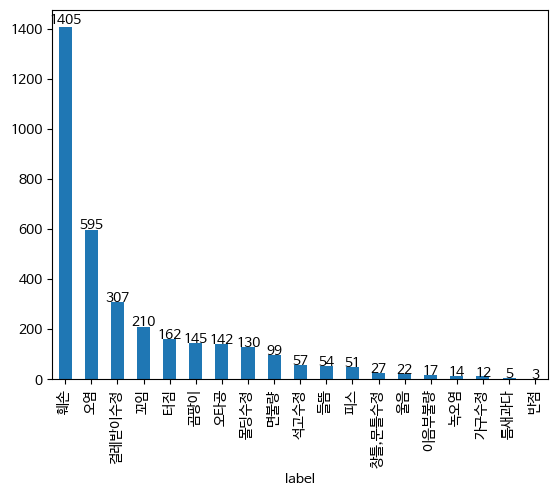

In [32]:
ax = train_df['label'].value_counts().plot.bar()
for p in ax.patches:
    left, bottom, width, height = p.get_bbox().bounds
    ax.annotate("%d"%(height), (left+width/2, height*1.01), ha='center')

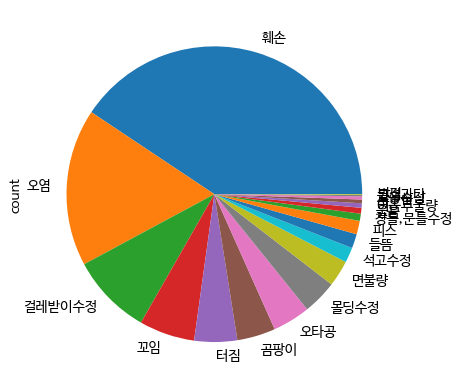

In [33]:
ax = train_df['label'].value_counts().plot.pie()


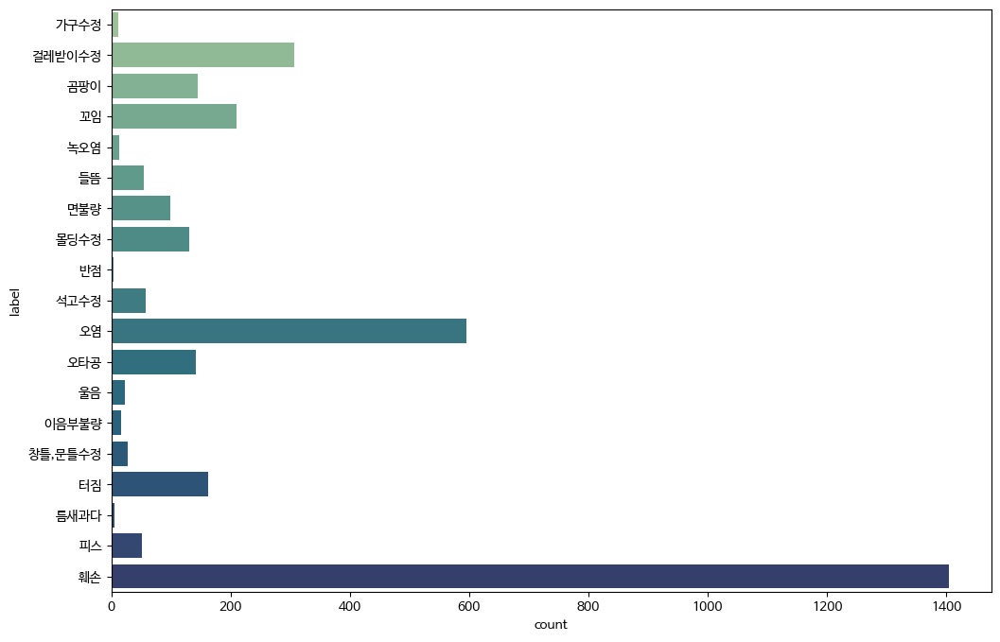

In [60]:
plt.figure(figsize=(12,8))
ax = sns.countplot(data=train_df, y='label', palette='crest', dodge=False)
plt.show()

## 이미지 확인

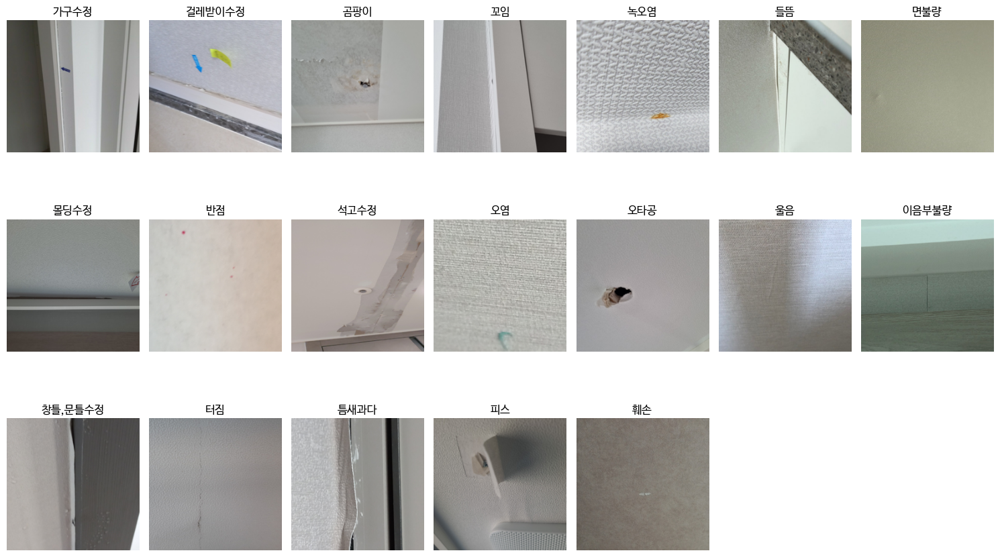

In [37]:
plt.figure(figsize = (15,12))
for idx, i in enumerate(train_df.label.unique()):
    plt.subplot(4,7,idx+1)

    df = train_df[train_df['label'] == i].reset_index(drop= True)
    image_path = df.loc[random.randint(0, len(df)-1), 'path']
    img = Image.open(image_path)
    img = img.resize((224,224))
    plt.imshow(img)
    plt.axis('off')
    plt.title(i)
plt.tight_layout()
plt.show()

In [46]:
train_df['label'].unique()

array(['가구수정', '걸레받이수정', '곰팡이', '꼬임', '녹오염', '들뜸', '면불량', '몰딩수정', '반점',
       '석고수정', '오염', '오타공', '울음', '이음부불량', '창틀,문틀수정', '터짐', '틈새과다', '피스',
       '훼손'], dtype=object)

In [54]:
def plot_images(df, label):
    plt.figure(figsize = (12,12))
    species_df = df[df['label'] == label].reset_index(drop=True)
    plt.suptitle(label)
    for idx, i in enumerate(np.random.choice(species_df['path'],32)):
        plt.subplot(8,8,idx+1)
        image_path = i
        img = Image.open(image_path)
        img = img.resize((224,224))
        plt.imshow(img)
        plt.axis('off')
    plt.tight_layout()
    plt.show()

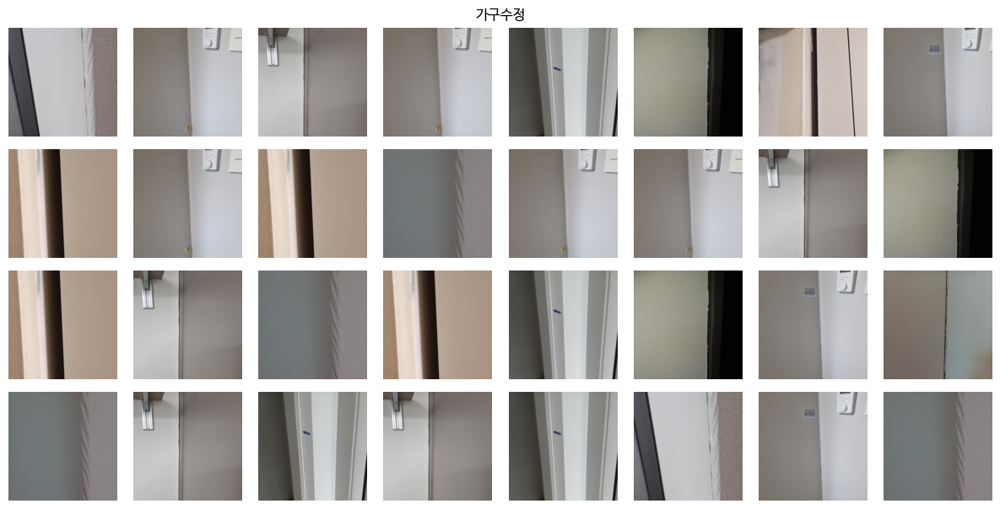

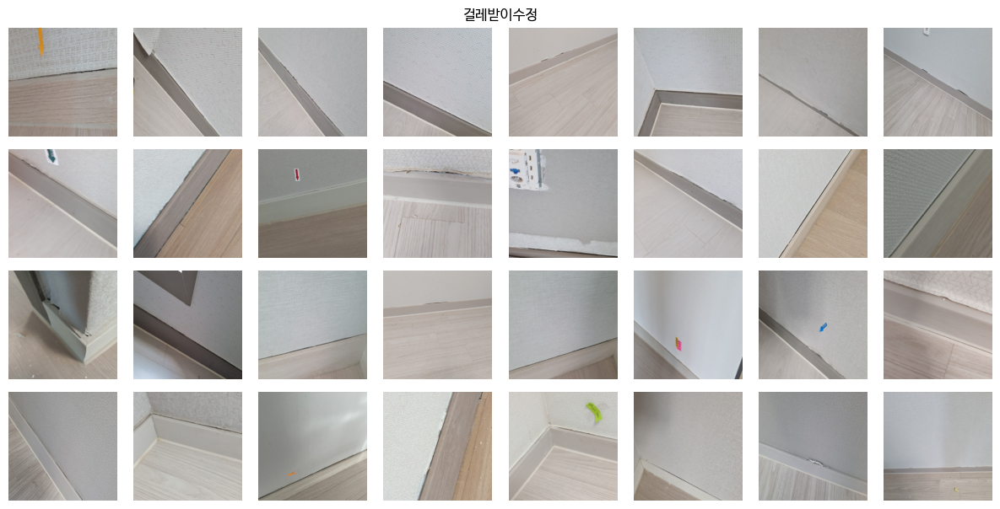

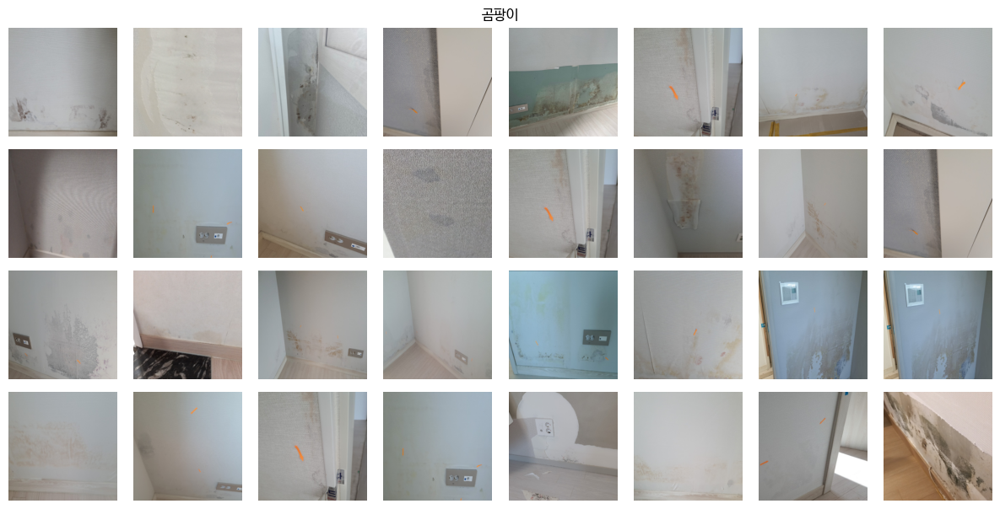

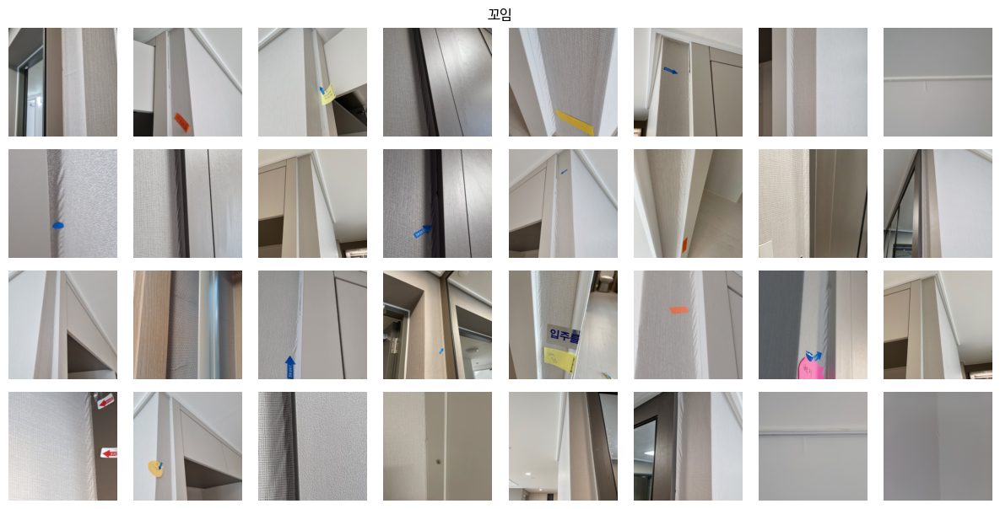

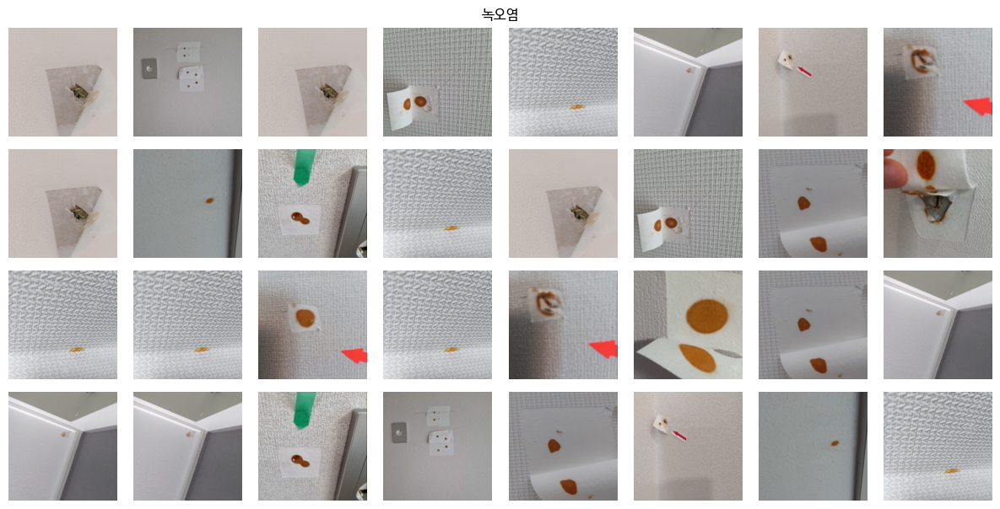

...

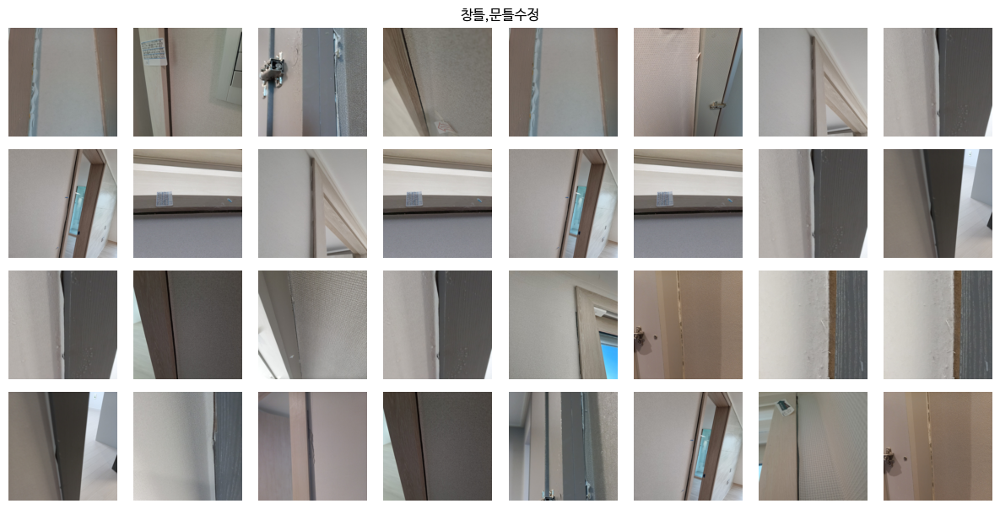

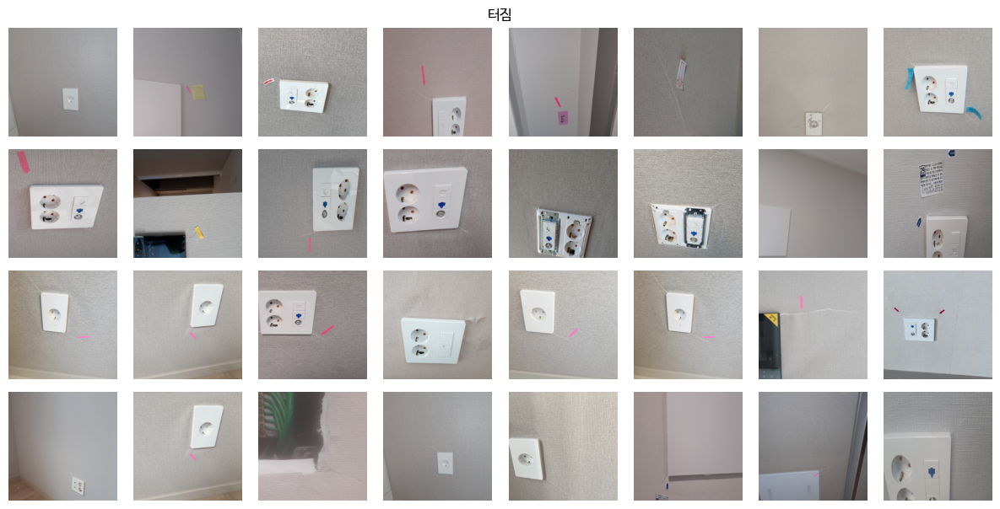

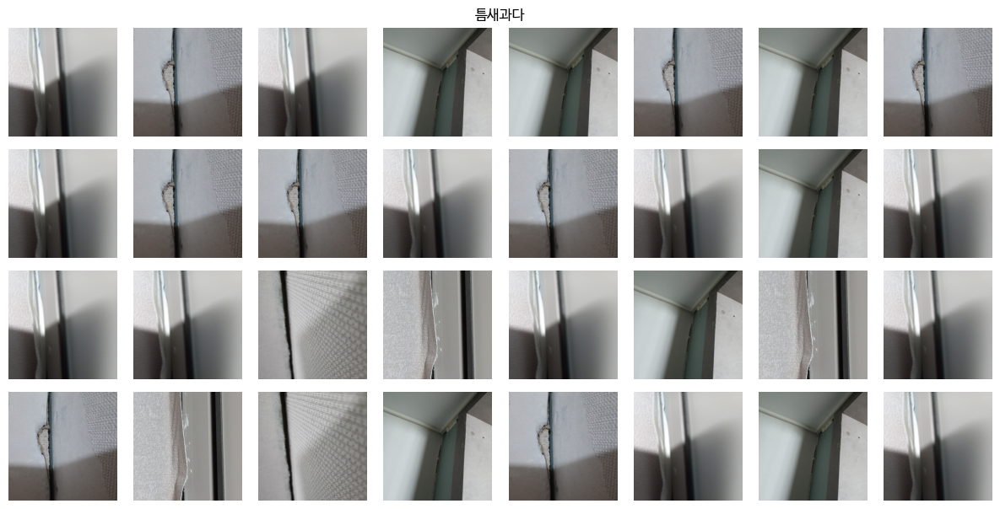

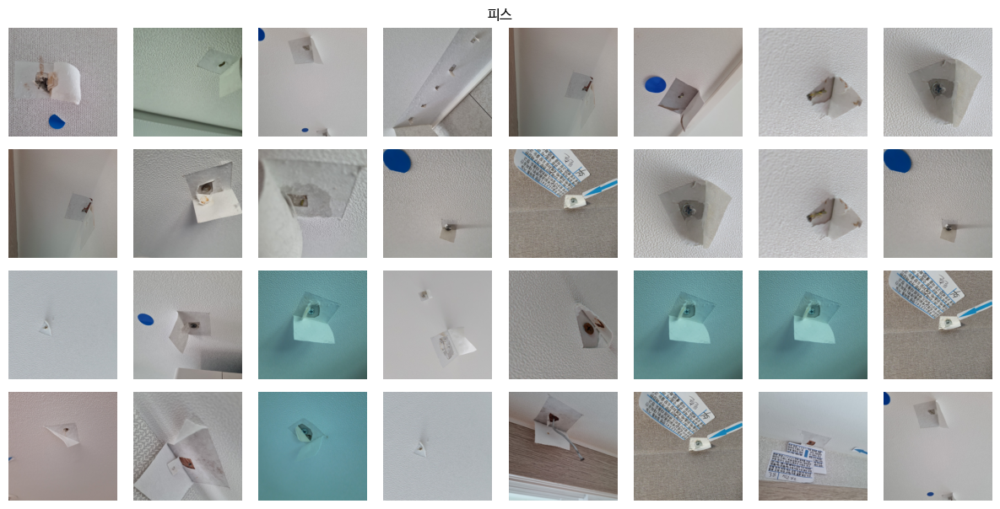

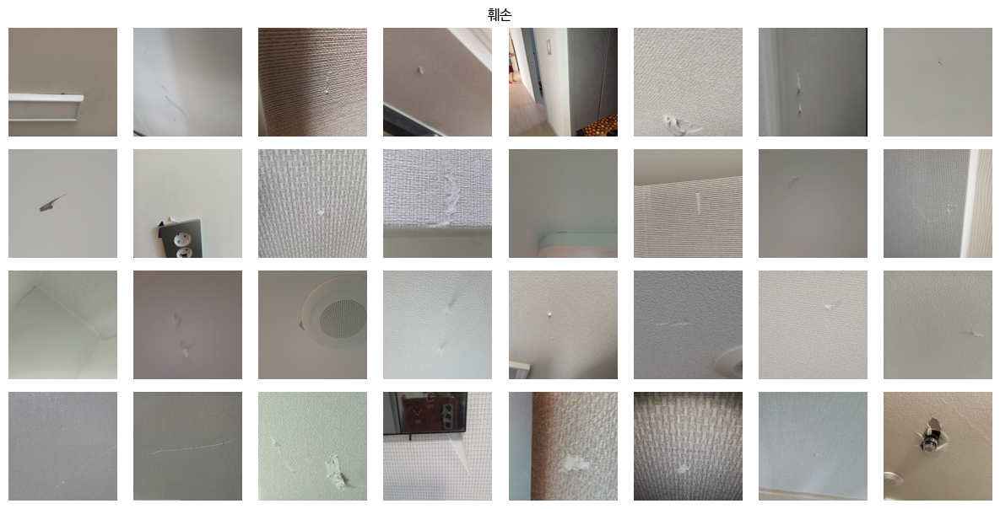

In [55]:
for la in train_df['label'].unique():
    plot_images(train_df, label = la)